In [2]:
#import data
import pandas as pd
import numpy as np
data = pd.read_csv('wdbc.data',header=None,names=["id","class","radius_u1","texture_u1","perimeter_u1",
                                                    "area_u1","smoothness_u1","compactness_u1","concavity_u1",
                                                    "concave_u1","symmetry_u1","fracdim_u1",
                                                    "radius_sd","texture_sd","perimeter_sd",
                                                    "area_sd","smoothness_sd","compactness_sd","concavity_sd",
                                                    "concave_sd","symmetry_sd","fracdim_sd",
                                                    "radius_u2","texture_u2","perimeter_u2",
                                                    "area_u2","smoothness_u2","compactness_u2","concavity_u2",
                                                    "concave_u2","symmetry_u2","fracdim_u2"])
# see how many instances are there in each class
print(data.groupby(data["class"]).size())
# describe the data
print(data.head())

class
B    357
M    212
dtype: int64
         id class  radius_u1  texture_u1  perimeter_u1  area_u1  \
0    842302     M      17.99       10.38        122.80   1001.0   
1    842517     M      20.57       17.77        132.90   1326.0   
2  84300903     M      19.69       21.25        130.00   1203.0   
3  84348301     M      11.42       20.38         77.58    386.1   
4  84358402     M      20.29       14.34        135.10   1297.0   

   smoothness_u1  compactness_u1  concavity_u1  concave_u1  ...  radius_u2  \
0        0.11840         0.27760        0.3001     0.14710  ...      25.38   
1        0.08474         0.07864        0.0869     0.07017  ...      24.99   
2        0.10960         0.15990        0.1974     0.12790  ...      23.57   
3        0.14250         0.28390        0.2414     0.10520  ...      14.91   
4        0.10030         0.13280        0.1980     0.10430  ...      22.54   

   texture_u2  perimeter_u2  area_u2  smoothness_u2  compactness_u2  \
0       17.33       

In [3]:
# separate the data into malignant and benign cases
data_M = data.loc[data['class']=='M']
data_B = data.loc[data['class']=='B']
# separate the target and features in each class
data_M_x = data_M.iloc[:,2:33]
data_M_y = data_M.iloc[:,1]
data_B_x = data_B.iloc[:,2:33]
data_B_y = data_B.iloc[:,1]

### 1(b) Choose the first 30 malignant cases and the first 50 benign cases in the data set as the test set and the rest as the training set.

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
# split the M and B datasets into training and test sets
X_M_train, X_M_test, y_M_train, y_M_test = train_test_split(data_M_x,data_M_y, test_size = 30, shuffle=False)
X_B_train, X_B_test, y_B_train, y_B_test = train_test_split(data_B_x,data_B_y, test_size = 50, shuffle=False)
# union the training sets of M and B
X_train = pd.concat([X_M_train,X_B_train])
y_train = pd.concat([y_M_train,y_B_train])
# union the test sets of M and B
X_test = pd.concat([X_M_test,X_B_test])
y_test = pd.concat([y_M_test,y_B_test])

### (c) Binary Classification Using Logistic Regression
### i. Depict scatter plots of the features in your training set in a scatter matrix.

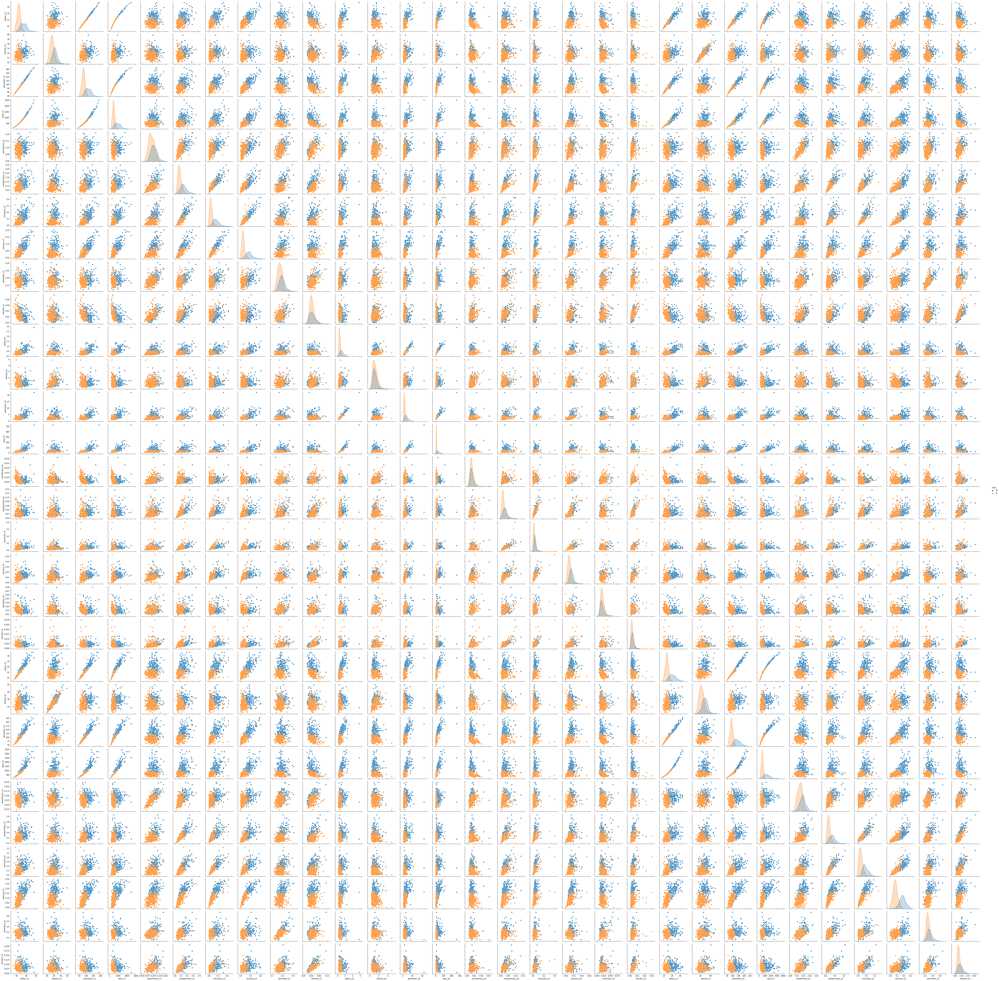

In [20]:
import seaborn as sns
y_train = pd.DataFrame(y_train)
# make a copy of X_train
train_set = X_train.copy()
train_set['class'] = y_train
sns.pairplot(train_set, hue='class')

ii.Use logistic regression to solve the binary classification problem. 

In [31]:
#Normalize the training and test data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled_train = scaler.fit_transform(X_train)
scaled_test = scaler.fit_transform(X_test)
# run logistic regression
logisticRegr = LogisticRegression()
logisticRegr.fit(scaled_train,y_train)

# predictions for the training data set
train_predict = logisticRegr.predict(scaled_train)
# predict probabilities for the train data
train_probs = logisticRegr.predict_proba(scaled_train)
# keep the probabilities of the positive(malignant) class only
train_probs = train_probs[:,1]

# predictions for the test data set
test_predict = logisticRegr.predict(scaled_test)
# predict probabilities for the test data
test_probs = logisticRegr.predict_proba(scaled_test)
# keep the probabilities of the positive(malignant) class only
test_probs = test_probs[:,1]

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


### Report the confusion matrix, ROC, precision, recall, F1 score, and AUC for both the train and test data sets.

Results of the training data:
Confusion matrix:
 [[307   0]
 [ 11 171]]


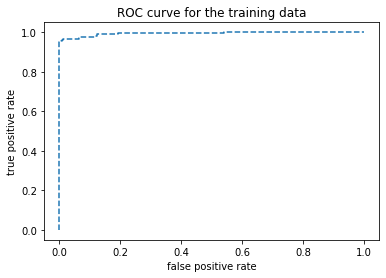

AUC: 0.9937538032000574
F1 score: 0.9688385269121813
Recall: 0.9395604395604396
Precision: 1.0

Results of the test data:
Confusion matrix:
 [[48  2]
 [ 1 29]]


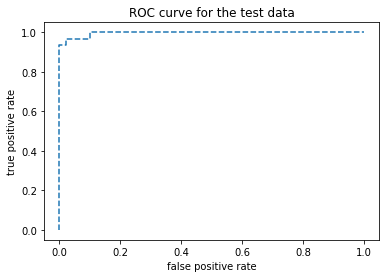

AUC: 0.996
F1 score: 0.9508196721311476
Recall: 0.9666666666666667
Precision: 0.9354838709677419


In [23]:
import matplotlib.pyplot as plt
print("Results of the training data:")
print("Confusion matrix:\n",metrics.confusion_matrix(y_train,train_predict))
fpr_train, tpr_train, thresh1 = metrics.roc_curve(y_train,train_probs,pos_label='M')
# plot roc curves
plt.plot(fpr_train, tpr_train, linestyle='--')
plt.title('ROC curve for the training data')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.show();
print("AUC:", metrics.auc(fpr_train, tpr_train))
print("F1 score:",metrics.f1_score(y_train,train_predict,pos_label='M'))
print("Recall:",metrics.recall_score(y_train,train_predict,pos_label='M'))
print("Precision:",metrics.precision_score(y_train,train_predict,pos_label='M'))
print()

print("Results of the test data:")
print("Confusion matrix:\n",metrics.confusion_matrix(y_test,test_predict))

fpr_test, tpr_test, thresh2 = metrics.roc_curve(y_test,test_probs,pos_label='M')
# plot roc curves
plt.plot(fpr_test, tpr_test, linestyle='--')
plt.title('ROC curve for the test data')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.show();
print("AUC:",metrics.auc(fpr_test, tpr_test))
print("F1 score:",metrics.f1_score(y_test,test_predict,pos_label='M'))
print("Recall:",metrics.recall_score(y_test,test_predict,pos_label='M'))
print("Precision:",metrics.precision_score(y_test,test_predict,pos_label='M'))

### iii. Calculate the p-values for your logistic regression parameters and prune those variables that are not statistically significant. Refit a logistic regression model.

In [43]:
import statsmodels.api as sm
from sklearn import preprocessing 
# encode the label for the target variable
label_encoder = preprocessing.LabelEncoder() 
y_train_dummy = label_encoder.fit_transform(y_train)
y_test_dummy = label_encoder.fit_transform(y_test)
# use statsmodels for logistic regression
log_reg = sm.Logit(y_train_dummy, scaled_train).fit() 
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.034784
         Iterations 21
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  489
Model:                          Logit   Df Residuals:                      459
Method:                           MLE   Df Model:                           29
Date:                Sat, 27 Mar 2021   Pseudo R-squ.:                  0.9473
Time:                        14:24:52   Log-Likelihood:                -17.009
converged:                       True   LL-Null:                       -322.79
Covariance Type:            nonrobust   LLR p-value:                2.563e-110
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
0          -1359.9717    828.486     -1.642      0.101   -2983.774     263.830
1             21.1657     17

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


The variables that are statistically significant (p-value is around 0.1) are x1, x4, x5, x6, x8, x14, x17, x18, x29 and x30.

In [44]:
#prune statistically insignificant variables
scaled_train = pd.DataFrame(scaled_train)
scaled_test = pd.DataFrame(scaled_test)
cols = [1,2,6,8,9,10,11,12,14,15,18,19,20,21,22,23,24,25,26,27]
scaled_train_pruned = scaled_train.drop(scaled_train.columns[cols],axis=1)

log_reg = sm.Logit(y_train_dummy, scaled_train_pruned).fit() 
print(log_reg.summary())

# use sklearn on the pruned data set to generate predictions
logisticRegr1 = LogisticRegression()
logisticRegr1.fit(scaled_train_pruned,y_train_dummy)
train_pred_pruned = logisticRegr1.predict(scaled_train_pruned)
# predict probabilities for the train data
train_prob = logisticRegr1.predict_proba(scaled_train_pruned)
# keep the probabilities of the positive class only
train_prob = train_prob[:,1]


scaled_test_pruned = scaled_test.drop(scaled_test.columns[cols],axis=1)
test_pred_pruned = logisticRegr1.predict(scaled_test_pruned)
# predict probabilities for the train data
test_prob = logisticRegr1.predict_proba(scaled_test_pruned)
# keep the probabilities of the positive class only
test_prob = test_prob[:,1]

Optimization terminated successfully.
         Current function value: 0.131306
         Iterations 11
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                  489
Model:                          Logit   Df Residuals:                      479
Method:                           MLE   Df Model:                            9
Date:                Sat, 27 Mar 2021   Pseudo R-squ.:                  0.8011
Time:                        14:24:55   Log-Likelihood:                -64.208
converged:                       True   LL-Null:                       -322.79
Covariance Type:            nonrobust   LLR p-value:                1.208e-105
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
0           -118.4720     19.796     -5.985      0.000    -157.271     -79.673
3            161.5026     29

Results of the pruned training data:
Confusion matrix:
 [[299   8]
 [ 25 157]]


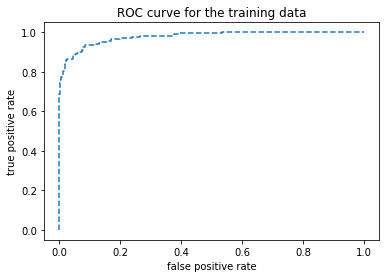

AUC: 0.9775745427211224
              precision    recall  f1-score   support

           0       0.92      0.97      0.95       307
           1       0.95      0.86      0.90       182

    accuracy                           0.93       489
   macro avg       0.94      0.92      0.93       489
weighted avg       0.93      0.93      0.93       489


Results of the pruned test data:
Confusion matrix:
 [[44  6]
 [ 1 29]]


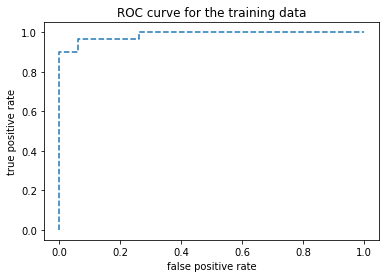

AUC: 0.9873333333333334
              precision    recall  f1-score   support

           0       0.98      0.88      0.93        50
           1       0.83      0.97      0.89        30

    accuracy                           0.91        80
   macro avg       0.90      0.92      0.91        80
weighted avg       0.92      0.91      0.91        80



In [45]:
# Results for the training and test set
print("Results of the pruned training data:")
print("Confusion matrix:\n",metrics.confusion_matrix(y_train_dummy,train_pred_pruned))
fpr_train, tpr_train, thresh1 = metrics.roc_curve(y_train_dummy,train_prob)
# plot roc curves
plt.plot(fpr_train, tpr_train, linestyle='--')
plt.title('ROC curve for the training data')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.show();
print("AUC:", metrics.auc(fpr_train, tpr_train))
print(metrics.classification_report(y_train_dummy,train_pred_pruned))

print()
print("Results of the pruned test data:")
print("Confusion matrix:\n",metrics.confusion_matrix(y_test_dummy,test_pred_pruned))
fpr_test, tpr_test, thresh1 = metrics.roc_curve(y_test_dummy,test_prob)
# plot roc curves
plt.plot(fpr_test, tpr_test, linestyle='--')
plt.title('ROC curve for the training data')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.show();
print("AUC:", metrics.auc(fpr_test, tpr_test))

print(metrics.classification_report(y_test_dummy,test_pred_pruned))


### iv. Do your classes seem to be well-separated to cause instability in calculating logistic regression parameters?

Yes.

## 2. Breast Cancer Prognosis

### (a) Load the data

In [51]:
data2 = pd.read_csv('wpbc.data',header=None)
# Convert string labels to numerical values
from sklearn import preprocessing
encoder = preprocessing.LabelEncoder()
encoded_data=encoder.fit_transform(data2[1])
data2[1] = encoded_data

### (b) Select the first 130 non-recurrent cases and the first 37 recurrent cases as your training set. Add record #197 in the data set to your training set as well.

In [52]:
# drop record 197 from data2 and make a copy of it before separating the data into non-recurrent and recurrent class
# make a copy of record 197 for later use
data_197 = pd.DataFrame(data2.iloc[196])
data2_new = data2.drop(196)

#separate the non-recurrent and recurrent cases
data_N = data2_new.loc[data2[1]== 0]
data_R = data2_new.loc[data2[1]== 1]

#separate the target and features
data_N_x = data_N.iloc[:,3:]
data_N_y = data_N.iloc[:,1]
data_R_x = data_R.iloc[:,3:]
data_R_y = data_R.iloc[:,1]

# separate the target and features for record 197
data_197 = data_197.transpose()
data_197_x = data_197.iloc[:,3:]
data_197_y = data_197.iloc[:,1]

# split the M and B datasets into training and test sets
X_N_train, X_N_test, y_N_train, y_N_test = train_test_split(data_N_x,data_N_y, train_size = 130, shuffle=False)
X_R_train, X_R_test, y_R_train, y_R_test = train_test_split(data_R_x,data_R_y, train_size = 37, shuffle=False)

# join non-recurrent and recurrent cases for training test, as well as record 197
X_train = pd.concat([X_N_train,X_R_train,data_197_x])
y_train = pd.concat([y_N_train,y_R_train,data_197_y])
y_train = y_train.astype('int')

# union the test sets of M and B
X_test = pd.concat([X_N_test,X_R_test])
y_test = pd.concat([y_N_test,y_R_test])
y_test = y_test.astype('int')

### (c) There are four instances in your training set that are missing the lymph node feature (denoted as ?). This is not a very severe issue, so replace the missing features with the median of the lymph node feature in your training set.

In [53]:
from sklearn.impute import SimpleImputer
# convert all ? values in training dataset to NaN
X_train = X_train.apply(pd.to_numeric, errors='coerce')
# for data imputing
imp_med = SimpleImputer(missing_values=np.nan, strategy='median')
imp_med.fit(X_train)
imputed_training = imp_med.transform(X_train)
print(imputed_training)


[[1.802e+01 2.760e+01 1.175e+02 ... 8.113e-02 5.000e+00 5.000e+00]
 [1.799e+01 1.038e+01 1.228e+02 ... 1.189e-01 3.000e+00 2.000e+00]
 [2.137e+01 1.744e+01 1.375e+02 ... 9.067e-02 2.500e+00 0.000e+00]
 ...
 [1.550e+01 2.108e+01 1.029e+02 ... 1.048e-01 4.000e-01 0.000e+00]
 [2.018e+01 1.954e+01 1.338e+02 ... 8.075e-02 4.500e+00 2.700e+01]
 [2.142e+01 2.284e+01 1.450e+02 ... 8.981e-02 3.000e+00 1.000e+00]]


### (d) Binary Classification Using Na ̈ıve Bayes’ Classifiers

### i. Solve the problem using a Na ̈ıve Bayes’ classifier. Use Gaussian class conditional distributions. Report the confusion matrix, ROC, precision, recall, F1 score, and AUC for both the train and test data sets.

In [54]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
# fit the model using the training set
gnb.fit(imputed_training,y_train)

# predictions for the training set
y_train_pred = gnb.predict(imputed_training)

# predict probabilities for the train data
y_train_score = gnb.predict_proba(imputed_training)

# keep the probabilities of the positive(malignant) class only
y_train_score = y_train_score[:,1]

# predictions for the test set
y_test_pred = gnb.predict(X_test)

# Predict probabilities for the test data
y_test_score= gnb.predict_proba(X_test)

# keep the probabilities of the positivie class only
y_test_score = y_test_score[:,1]


Results for the training set:
Confusion matrix: 
 [[98 32]
 [20 18]]


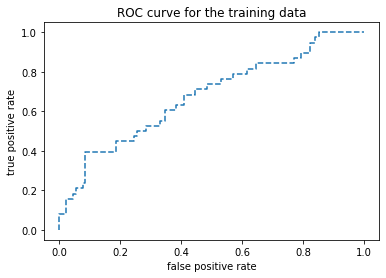

AUC: 0.6757085020242914
F1 score: 0.40909090909090906
Recall: 0.47368421052631576
Precision: 0.36
Accuracy: 0.6904761904761905

Results for the test set:
Confusion matrix: 
 [[14  7]
 [ 6  3]]


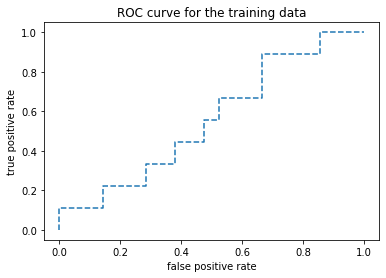

AUC: 0.5555555555555556
F1 score: 0.3157894736842105
Recall: 0.3333333333333333
Precision: 0.3
Accuracy: 0.5666666666666667



In [55]:
print('Results for the training set:')
print('Confusion matrix: \n',metrics.confusion_matrix(y_train,y_train_pred))
fpr_train, tpr_train, thresh1 = metrics.roc_curve(y_train,y_train_score,pos_label=1)
# plot roc curves
plt.plot(fpr_train, tpr_train, linestyle='--')
plt.title('ROC curve for the training data')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.show()
print("AUC:", metrics.auc(fpr_train, tpr_train))
print("F1 score:",metrics.f1_score(y_train,y_train_pred))
print("Recall:",metrics.recall_score(y_train,y_train_pred))
print("Precision:",metrics.precision_score(y_train,y_train_pred))
print("Accuracy:",metrics.accuracy_score(y_train,y_train_pred))
print()

print('Results for the test set:')
print('Confusion matrix: \n',metrics.confusion_matrix(y_test,y_test_pred))
fpr_test, tpr_test, thresh2 = metrics.roc_curve(y_test,y_test_score,pos_label=1)
# plot roc curves
plt.plot(fpr_test,tpr_test, linestyle='--')
plt.title('ROC curve for the training data')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.show()
print("AUC:", metrics.auc(fpr_test, tpr_test))
print("F1 score:",metrics.f1_score(y_test,y_test_pred))
print("Recall:",metrics.recall_score(y_test,y_test_pred))
print("Precision:",metrics.precision_score(y_test,y_test_pred))
print("Accuracy:",metrics.accuracy_score(y_test,y_test_pred))
print()


### ii. This data set is rather imbalanced. Balance your data set using SMOTE, by downsampling the common class in the training set to 90 instances and upsampling the uncommon class to 90 instances. Use k = 5 nearest neighbors in SMOTE. Remember not to change the balance of the test set. Report the confusion matrix, ROC, precision, recall, F1 score, and AUC for both the train and test data sets. Does SMOTE help?

In [69]:
from sklearn.utils import resample
import imblearn
from imblearn.over_sampling import SMOTE
sm = SMOTE(sampling_strategy={1:90},random_state = 4, k_neighbors = 5)
X_train_re, y_train_re = sm.fit_resample(imputed_training,y_train)